In [35]:
from sklearn .datasets import make_blobs
import plotly .express as pe
import plotly
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram , linkage, cut_tree
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [14]:
data,cluster = make_blobs(n_samples=50000,n_features=3,centers=np.array([[2.0,-3.5,1.0,], [4.0,2.5,-3.0], [1.0,1.0,-1.0]]), random_state=123)


In [21]:
fig =pe.scatter_3d(x=data[:,0], y=data[:,1], z= data[:,2], color=cluster)

In [22]:
fig.update_traces(marker=dict(size=2,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [23]:
km= KMeans(n_clusters=500)
km.fit(data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=500, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [24]:
data_hierarchy = km.cluster_centers_

In [25]:
##scipy hierarchical clusterng gives the dendrogram whereas sklearn does not give dendrogam
#distance metric is Euclidian
#Here we have used complete likage as  most of the cases the obectiev is to obtain spherical clusters . Here also we
#have already seen that the clusters are spherical
#If we don't have any idea , first we will i=use he tsn plot to get an idea of the possible shape of clusters in hig dimension 
z=linkage(y=data_hierarchy, method='complete')



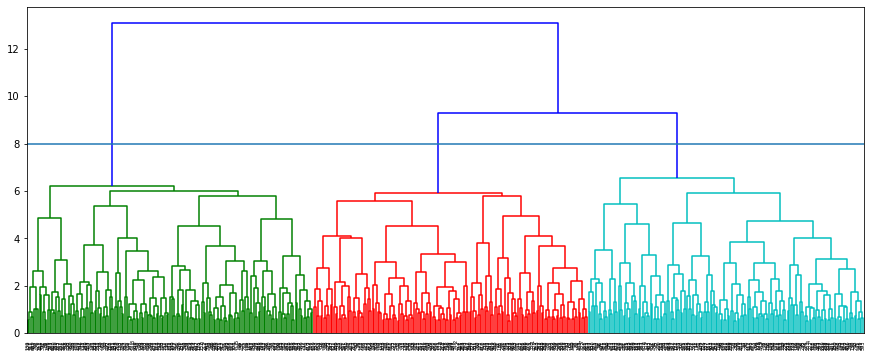

In [30]:
plt.figure(figsize=(15,6))
d=dendrogram(z)
plt.axhline(y=8)

In [31]:
h_clust = cut_tree(z, height =8.5)

In [37]:
# add the data ponts to the cluster
data_df = pd.DataFrame(data, columns=['V1', 'V2', 'v3'])

In [38]:
data_df['km_clust'] = km.labels_

In [39]:
data_df.head()

,V1,V2,v3,km_clust
0,4.068860,1.837837,-2.191350,435
1,2.207224,2.156290,-3.511405,263
2,2.458394,1.639064,-1.488936,138
3,2.046292,1.984844,-1.962012,166
4,1.135554,-1.849192,0.602868,356


In [51]:
data_df.groupby('km_clust').mean().head()

,V1,V2,v3
km_clust,,,
0,2.084283,-2.094396,2.624009
1,2.274882,2.580248,-1.139421
2,4.275850,3.425640,-3.163149
3,1.907796,-3.403415,0.423256
4,0.719893,0.504782,-1.272067


In [52]:
data_hierarchy[:5,:]

array([[ 2.08428334, -2.09439577,  2.62400909],
       [ 2.27488194,  2.58024752, -1.13942132],
       [ 4.27585027,  3.42563973, -3.16314932],
       [ 1.90851495, -3.39977109,  0.42331485],
       [ 0.71989338,  0.50478244, -1.27206747]])

In [53]:
df = pd.DataFrame(np.c_[np.array(range(500)), h_clust], columns=['km_clust', 'h_clust'])

In [54]:
df

,km_clust,h_clust
0,0,0
1,1,1
2,2,1
3,3,0
4,4,2
...,...,...
495,495,1
496,496,0
497,497,0
498,498,2


In [55]:
final_data = pd.merge(data_df, df, on = 'km_clust'  )

In [56]:
final_data

,V1,V2,v3,km_clust,h_clust
0,4.068860,1.837837,-2.191350,435,1
1,4.236011,2.074350,-2.772278,435,1
2,4.542684,1.983208,-2.113560,435,1
3,4.507444,2.107729,-2.240352,435,1
4,4.711084,2.101574,-2.362864,435,1
...,...,...,...,...,...
49995,-0.441580,-1.216791,-3.175668,276,2
49996,-0.306440,-1.377275,-2.583654,276,2
49997,-0.857668,-2.101503,-2.071867,276,2
49998,-0.641125,-1.446881,-2.145531,276,2


In [59]:
final_data.head()

,V1,V2,v3,km_clust,h_clust
0,4.068860,1.837837,-2.191350,435,1
1,4.236011,2.074350,-2.772278,435,1
2,4.542684,1.983208,-2.113560,435,1
3,4.507444,2.107729,-2.240352,435,1
4,4.711084,2.101574,-2.362864,435,1


In [63]:
fig =pe.scatter_3d(data_frame=final_data, x='V1', y='V2', z='v3', color='h_clust')
fig.update_traces(marker=dict(size=2,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [ ]:
pd.crosstab(cluster, finl_data)